In [1]:
import torch
from torch import nn
import matplotlib.pyplot as plt
import numpy as np
import time

#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = "cpu"
device

'cpu'

## Neural Network Model

In [2]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.layers = nn.Sequential(
        nn.Linear(1,10),
        nn.Sigmoid(),
        nn.Linear(10,1, bias=False)
        )
        
    def forward(self, x):
        N = self.layers(x)
        return N

In [3]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model.parameters(), 2)
    optimizer.step(closure)   

### Differential equation
$$\frac{d^2\phi(r)}{dr^2} + \frac{2m}{\hbar^2}\left(E-\frac{l(l+1)}{2mr^2}\hbar^2+V(r)\right)\phi(r) = 0$$ 
Dataset are vectors of domain of differential equation, like the vectors are one-dimentional, the shape of dataset is one by m samples. Trial solution $\phi_t(r) = e^{-\beta r^2}N(r,\vec{p})$, with $\phi(r=0) = 0$ and $\phi(r\rightarrow\infty) = 0$ as boundary conditions.  

In [4]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0

V = lambda r: -(Z*e**2)/r
Phi_t = lambda r: r*torch.exp(-beta*r) * model.forward(r)

In [5]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data)

In [6]:
def loss_fn(r):
    r.requires_grad = True
    
    Phi = Phi_t(r)    
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=0 to 6

    prom = Phi.size()[0]
    
    global E
    E = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E*Phi[100:])**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [7]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 2e-2
Phis_t = []
Es = []
lss = []
epochs = []



start = time.time()

model = NeuralNetwork().to(device)
initialize_weights(model)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
for t in range(epoch+1):
    loss = loss_fn(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss}")
    training(R_train, loss_fn, optimizer)
    if t%100 == 0:
        Phis_t.append(Phi_t(R_train).detach().numpy())
        Es.append(E.detach().numpy())
        lss.append(loss.detach().numpy())
        epochs.append(t)
Es = np.squeeze(Es)
lss = np.squeeze(lss)
Phis_t = np.squeeze(Phis_t)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([47.0961], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([38.5352], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([29.6169], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([20.6558], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([12.3245], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([6.0239], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([4.5145], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([10.0468], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([13.1138], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([10.8313], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([7.3591], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([5.0618], grad_fn=<DivBackward0>)
Epoch 13
 ---------------------- loss: te

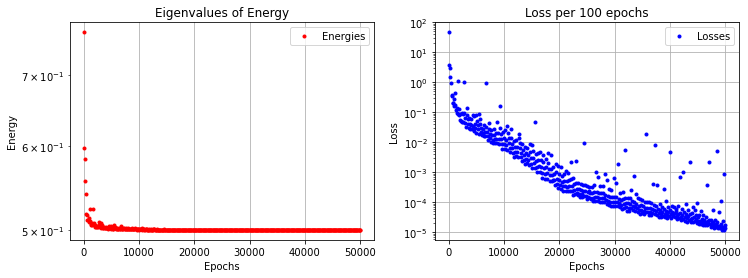

In [8]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs, 1+Es, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs, lss, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

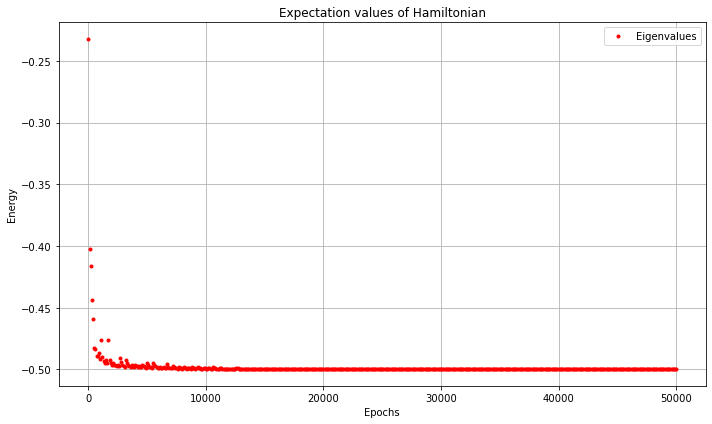

In [9]:
plt.figure(figsize=(10,6))
plt.plot(epochs, Es, "r.", label="Eigenvalues")
plt.title("Expectation values of Hamiltonian")
#plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.tight_layout()
plt.rc("font", size=15)
plt.savefig("eigenvalue.png", dpi=600)
plt.show()

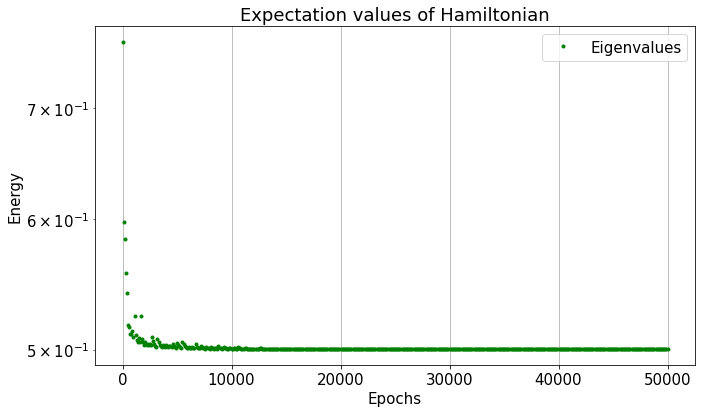

In [10]:
plt.figure(figsize=(10,6))
plt.plot(epochs, 1+Es, "g.", label="Eigenvalues")
plt.title("Expectation values of Hamiltonian")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.tight_layout()
plt.savefig("eigenvalue_1.png", dpi=600)
plt.show()

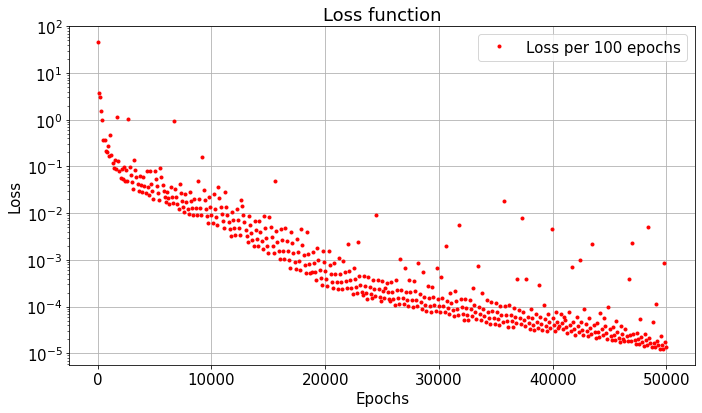

In [11]:
plt.figure(figsize=(10,6))
plt.plot(epochs, lss, "r.", label="Loss per 100 epochs")
plt.title("Loss function")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.tight_layout()
plt.rc("font", size=15)
plt.savefig("loss.png", dpi=600)
plt.show()

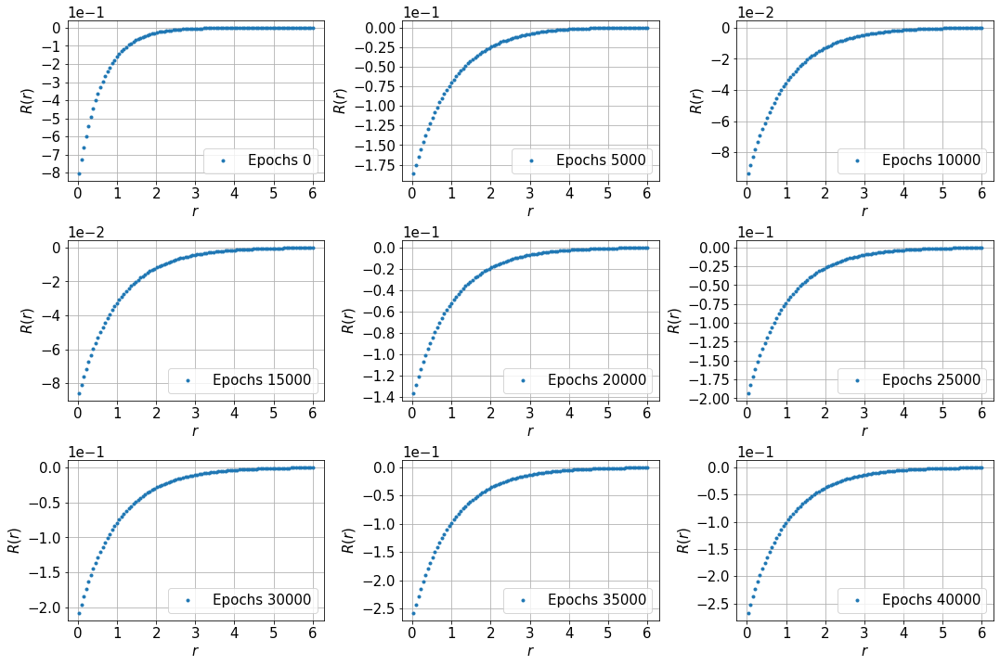

In [12]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.rc("font", size=8)
plt.tight_layout()
plt.show()  

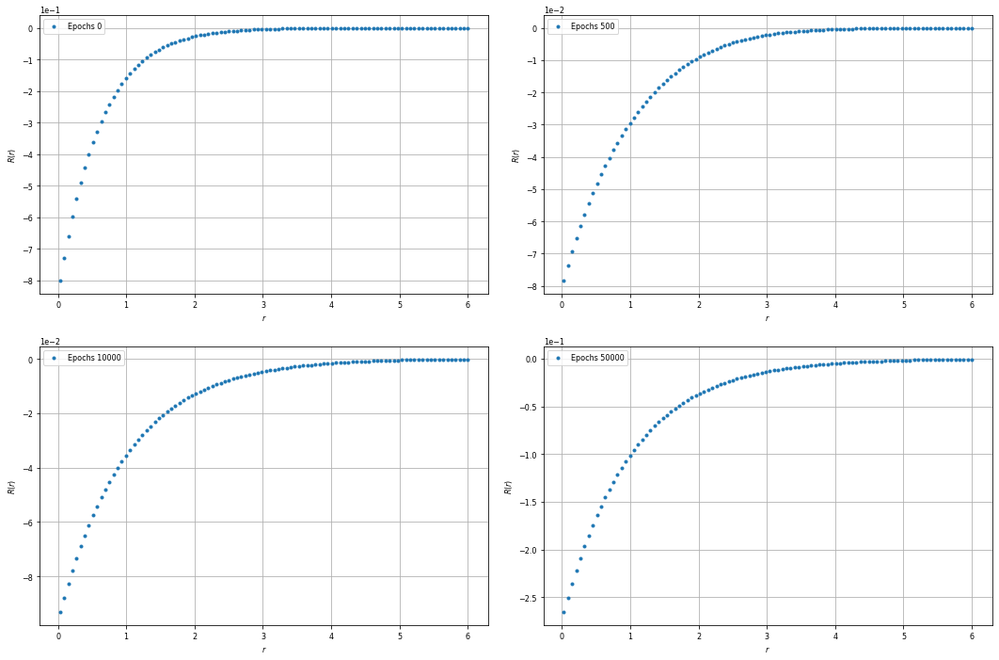

In [13]:
graphs = [0,5,100,500]
fig, axs = plt.subplots(2,2,figsize=(15,10))
fil = 0
col = 0
for i in graphs:
    yy = Phis_t[i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 1:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.rc("font", size=15)
plt.tight_layout()
plt.savefig("eigenstate.png", dpi=600)
plt.show()  

In [14]:
Es

array([-0.23212259, -0.4024545 , -0.41653016, -0.44380093, -0.4592408 ,
       -0.4826938 , -0.48375463, -0.48891324, -0.48927003, -0.48691747,
       -0.49138907, -0.47620696, -0.4901124 , -0.49341935, -0.49481294,
       -0.49217176, -0.49487358, -0.4763948 , -0.49230668, -0.49503654,
       -0.49647048, -0.4950276 , -0.49666032, -0.49602652, -0.49693325,
       -0.49615523, -0.4970108 , -0.49109626, -0.4941902 , -0.49604642,
       -0.4972033 , -0.4979559 , -0.4924026 , -0.49501005, -0.4965058 ,
       -0.49746522, -0.49814153, -0.49647382, -0.4975708 , -0.4982399 ,
       -0.49649903, -0.49761948, -0.4982977 , -0.49729794, -0.49781504,
       -0.49844337, -0.4961165 , -0.49741733, -0.4982038 , -0.4986969 ,
       -0.49511585, -0.49677894, -0.4977505 , -0.49836028, -0.49879044,
       -0.49466926, -0.49637896, -0.4975298 , -0.49820694, -0.4986326 ,
       -0.4989272 , -0.4981683 , -0.49869075, -0.49899766, -0.4979093 ,
       -0.49857292, -0.49894255, -0.49598786, -0.49794394, -0.49

In [15]:
np.mean(Es)

-0.49804315

In [16]:
norm = torch.trapezoid(Phi_t(R_train)[100:]**2,R_train[100:],dim=0)
norm = norm.detach()
norm

tensor([0.0187])

In [17]:
torch.trapezoid(Phi_t(R_train)[100:]**2,R_train[100:],dim=0)/norm

tensor([1.], grad_fn=<DivBackward0>)

In [18]:
Phi_0 = Phi_t(R_train)
#Phi_0 = Phi_0/torch.sqrt(norm)
Phi_0 = Phi_0.detach()
new = torch.trapezoid(Phi_0[100:]**2,R_train[100:],dim=0)
new

tensor([0.0187], grad_fn=<DivBackward1>)

In [19]:
Phi_0

tensor([[-4.4762e+02],
        [-3.7608e+02],
        [-3.1349e+02],
        [-2.5883e+02],
        [-2.1121e+02],
        [-1.6983e+02],
        [-1.3398e+02],
        [-1.0302e+02],
        [-7.6372e+01],
        [-5.3534e+01],
        [-3.4052e+01],
        [-1.7518e+01],
        [-3.5738e+00],
        [ 8.1010e+00],
        [ 1.7792e+01],
        [ 2.5751e+01],
        [ 3.2204e+01],
        [ 3.7348e+01],
        [ 4.1360e+01],
        [ 4.4396e+01],
        [ 4.6592e+01],
        [ 4.8070e+01],
        [ 4.8936e+01],
        [ 4.9285e+01],
        [ 4.9198e+01],
        [ 4.8747e+01],
        [ 4.7996e+01],
        [ 4.6999e+01],
        [ 4.5804e+01],
        [ 4.4453e+01],
        [ 4.2981e+01],
        [ 4.1419e+01],
        [ 3.9794e+01],
        [ 3.8128e+01],
        [ 3.6441e+01],
        [ 3.4748e+01],
        [ 3.3064e+01],
        [ 3.1400e+01],
        [ 2.9764e+01],
        [ 2.8166e+01],
        [ 2.6610e+01],
        [ 2.5102e+01],
        [ 2.3645e+01],
        [ 2

In [20]:
file_Phi = open("file.txt","w")
for row in Phi_0:
    np.savetxt(file_Phi, row)
file_Phi.close() 

In [21]:
model_1 = NeuralNetwork()
model_1

NeuralNetwork(
  (layers): Sequential(
    (0): Linear(in_features=1, out_features=10, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=10, out_features=1, bias=False)
  )
)

In [22]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model_1.parameters(), 2)
    optimizer.step(closure)   

In [23]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0
global Phi_0

V = lambda r: -(Z*e**2)/r
Phi_aux = lambda r: r*torch.exp(-beta*r) * model_1.forward(r)
Phi_t_1 = lambda r: Phi_aux(r) - Phi_0*torch.trapezoid(Phi_0[100:]*Phi_aux(r)[100:], r[100:],dim=0)

In [24]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data)

In [25]:
def loss_fn_1(r):
    r.requires_grad = True
    
    Phi = Phi_t_1(r)
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    prom = Phi.size()[0]
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=0 to 6
    
    global E_1
    E_1 = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E_1*Phi[100:])**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [26]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 5e-2
Phis_t_1 = []
Es_1 = []
lss_1 = []
epochs_1 = []



start = time.time()

model_1 = NeuralNetwork().to(device)
initialize_weights(model_1)
optimizer_1 = torch.optim.Adam(model_1.parameters(), lr=1)
for t in range(epoch):
    loss_1 = loss_fn_1(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss_1}")
    training(R_train, loss_fn_1, optimizer_1)
    if t%100 == 0:
        Phis_t_1.append(Phi_t_1(R_train).detach().numpy())
        Es_1.append(E_1.detach().numpy())
        lss_1.append(loss_1.detach().numpy())
        epochs_1.append(t)
Es_1 = np.squeeze(Es_1)
lss_1 = np.squeeze(lss_1)
Phis_t_1 = np.squeeze(Phis_t_1)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([1638.7189], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([2203.5874], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([1771.1869], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([1491.2494], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([1243.8345], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([1039.1274], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([890.0659], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([785.9097], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([707.5349], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([644.5403], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([593.4506], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([552.2048], grad_fn=<DivBackward0>)
Epoch 13
 ---------

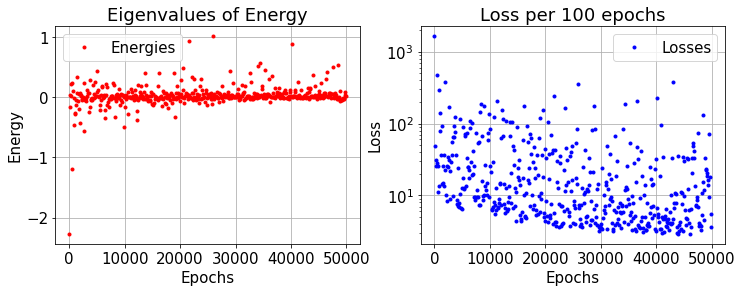

In [27]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs_1, Es_1, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
#plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs_1, lss_1, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

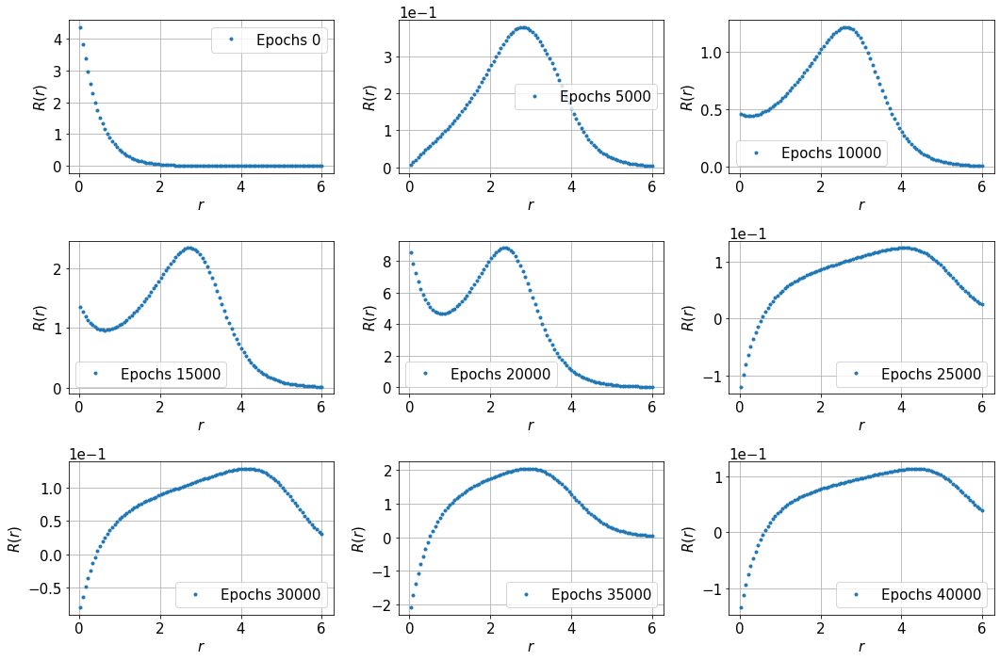

In [28]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t_1[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()  

In [29]:
Es_1

array([-2.27257180e+00, -1.65529698e-01,  3.00404932e-02,  2.65831519e-02,
        2.19600186e-01, -1.20187306e+00,  2.26283953e-01,  1.07764818e-01,
       -4.69790787e-01, -1.94994994e-02, -2.68109560e-01, -2.72464305e-01,
       -1.22933850e-01, -4.62550409e-02,  3.36877942e-01,  6.99743927e-02,
       -6.45697042e-02, -1.99097410e-01,  5.63537590e-02, -4.36684847e-01,
        6.63826838e-02,  3.26897129e-02,  2.65695304e-02, -4.51853871e-02,
       -3.04677319e-02, -5.61411260e-03,  2.31524080e-01, -5.58609068e-01,
       -4.05869335e-02, -1.44812260e-02, -6.03146404e-02, -1.60648674e-02,
        1.21627681e-01,  2.47815195e-02,  7.50488266e-02,  6.74880072e-02,
       -2.48779774e-01,  2.86912858e-01, -1.68590829e-01, -4.43025492e-02,
       -2.44082287e-02, -5.47779948e-02, -9.40627232e-03,  2.01073200e-01,
       -1.09555703e-02,  4.36792299e-02, -6.33952348e-03,  2.56227404e-01,
        1.63335018e-02,  1.31968176e-02,  8.70351121e-02,  4.27874893e-01,
        1.11412235e-01,  